# Factor Analysis for Long Short Equity Strategy

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import blaze as bz

from zipline.utils.tradingcalendar import get_trading_days
# from quantopian.pipeline.data.psychsignal import stocktwits
from quantopian.pipeline.data.morningstar import operation_ratios
from quantopian.pipeline.data import Fundamentals


In [3]:
from quantopian.pipeline import Pipeline, CustomFactor
from quantopian.pipeline.factors import Returns
from quantopian.research import run_pipeline

from quantopian.pipeline.factors import SimpleMovingAverage, RollingLinearRegressionOfReturns
from quantopian.pipeline.filters.morningstar import Q1500US

from quantopian.pipeline.classifiers.morningstar import Sector
from quantopian.pipeline.data import morningstar

from quantopian.pipeline.data.builtin import USEquityPricing


# EventVestor Earnings Calendar free from 01 Feb 2007 to 1 year ago.
from quantopian.pipeline.factors.eventvestor import (
    BusinessDaysUntilNextEarnings,
    BusinessDaysSincePreviousEarnings,
)

# EventVestor Mergers & Acquisitions free from 01 Feb 2007 to Dec 2017.
from quantopian.pipeline.filters.eventvestor import IsAnnouncedAcqTarget

from quantopian.pipeline.factors import BusinessDaysSincePreviousEvent


## Defining Momentum and Other Technical Indicators

In [4]:
class Momentum(CustomFactor):
    """ Conventional Momentum factor """
    inputs = [USEquityPricing.close,
                  Returns(window_length=126)]
    window_length = 252

    def compute(self, today, assets, out, prices, returns):
        out[:] = ((prices[-21] - prices[-252])/prices[-252] -
                    (prices[-1] - prices[-21])/prices[-252]) / np.nanstd(returns, axis=0)
#         out[:] = 0

class Liquidity(CustomFactor):   
    # Pre-declare inputs and window_length
    inputs = [USEquityPricing.volume, morningstar.valuation.shares_outstanding] 
    window_length = 1
    
    # Compute factor1 value
    def compute(self, today, assets, out, volume, shares):       
        out[:] = volume[-1]/shares[-1]
        
class Downside_Volatility(CustomFactor):  
    # Use returns as the input  
    inputs = [Returns(window_length=2)]  
    window_length = 10  
    def compute(self, today, assets, out, returns):  
        # set any returns greater than 0 to NaN so they are excluded from our calculations  
        returns[returns > 0] = np.nan  
        out[:] = np.nanstd(returns, axis=0)

In [5]:
start_date, end_date = '2014-02-01', '2016-12-30'

## Creating Pipeline and Testing IC for various factors and Trading Universe

In [7]:
def make_pipeline():
    
    operation_margin = operation_ratios.operation_margin.latest
    revenue_growth = operation_ratios.revenue_growth.latest
    value = (Fundamentals.ebit.latest / Fundamentals.enterprise_value.latest)
    roe = Fundamentals.roe.latest
    momentum = Momentum()
    liquidity = Liquidity()
    free_cash_flows = morningstar.valuation_ratios.fcf_yield.latest
    earnings_yield = morningstar.valuation_ratios.earning_yield.latest
    
    
    # Filter for stocks that are announced acquisition target.
    not_announced_acq_target = ~IsAnnouncedAcqTarget()
    mkt_cap_filter = morningstar.valuation.market_cap.latest >= 500000000
    universe = (
        Q1500US() 
#         & not_near_earnings_announcement
        & not_announced_acq_target
        & free_cash_flows.notnull()
        & earnings_yield.notnull()
        & value.notnull()
        & roe.notnull()
        & mkt_cap_filter
        & momentum.notnull()
    )
    
    combined_factor = (
        earnings_yield.winsorize(min_percentile=0.05, max_percentile=0.95).zscore(mask=universe) + 
        free_cash_flows.winsorize(min_percentile=0.05, max_percentile=0.95).zscore(mask=universe) + 
        value.winsorize(min_percentile=0.05, max_percentile=0.95).zscore(mask=universe) + roe.winsorize(min_percentile=0.05, max_percentile=0.95).zscore(mask=universe) + momentum.winsorize(min_percentile=0.05, max_percentile=0.95).zscore(mask=universe)                                                              
    )
    
    prediction_rank_quantiles = combined_factor.quantiles(10)
    
    longs = prediction_rank_quantiles.eq(9)
    shorts = prediction_rank_quantiles.eq(0)
    
    pipe = Pipeline(columns={
            'testing_factor':combined_factor,
            'Sector' : Sector(),
            'shorts':shorts,
            'longs':longs},
                    
                   screen=universe)
    return pipe

result = run_pipeline(make_pipeline(), start_date=start_date, end_date=end_date)
result.head()

/venvs/py35/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:1202: RuntimeWarning: Degrees of freedom <= 0 for slice.
  warnings.warn("Degrees of freedom <= 0 for slice.", RuntimeWarning)


Sector  longs shorts  \
2014-02-03 00:00:00+00:00 Equity(2 [ARNC])      101  False   True   
                          Equity(24 [AAPL])     311   True  False   
                          Equity(41 [ARCB])     310  False  False   
                          Equity(62 [ABT])      206  False  False   
                          Equity(67 [ADSK])     311  False  False   

                                             testing_factor  
2014-02-03 00:00:00+00:00 Equity(2 [ARNC])        -4.326781  
                          Equity(24 [AAPL])        4.253530  
                          Equity(41 [ARCB])        2.531790  
                          Equity(62 [ABT])         0.735548  
                          Equity(67 [ADSK])       -0.490282

In [8]:
assets = result.index.levels[1].unique()
pricing = get_pricing(assets, start_date=start_date, end_date=end_date, fields='open_price')
sectors = result['Sector']
len(assets)

1794

## Factor Analysis with AlphaLens
We analyse the ranking scheme designed by our combined alpha and for different quantiles and holding periods. We observe a strong seperation between upper and lower quantiles indicating a good seperating alpha factor to short the lowest quantile and go long on the highest. Since we are using a dollar neutral long-short strategy we only pick the extreme quantiles to trade on.

In [10]:
import alphalens
periods = (1, 3, 5)
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor=result['testing_factor'],
                                                                   prices = pricing,
                                                                   quantiles = 10,
                                                                   periods = periods,
                                                                   groupby = sectors
                                                                  )

factor_data.head()

Dropped 0.7% entries from factor data: 0.7% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


1D        3D        5D  \
date                      asset                                             
2014-02-03 00:00:00+00:00 Equity(2 [ARNC])  -0.022575 -0.036527 -0.024341   
                          Equity(24 [AAPL])  0.006446  0.020905  0.038114   
                          Equity(41 [ARCB]) -0.042373 -0.088596 -0.097077   
                          Equity(62 [ABT])  -0.018593 -0.004656  0.016120   
                          Equity(67 [ADSK]) -0.023917 -0.021956  0.016271   

                                               factor group  factor_quantile  
date                      asset                                               
2014-02-03 00:00:00+00:00 Equity(2 [ARNC])  -4.326781   101                1  
                          Equity(24 [AAPL])  4.253530   311               10  
                          Equity(41 [ARCB])  2.531790   310                8  
                          Equity(62 [ABT])   0.735548   206                6  
                          Equity(67 [ADSK]) -0.490282   311                4

#### AlphaLens Tearsheet
The quality of the ranking scheme is observed by checking the seperaton of returns for each quantile.

The Information Criteria provides a metric to estimate the effect of our factor on the returns based on spearman's correlation coefficient.

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-29.066051,-3.031207,-7.777419,4.296708,93461,10.034669
2,-4.274171,-0.964757,-2.338145,0.673994,93100,9.995909
3,-1.994836,-0.106656,-0.869666,0.350230,93030,9.988394
4,-0.832832,0.477472,-0.092931,0.243016,93094,9.995265
5,-0.053921,0.963711,0.493630,0.180508,93196,10.006217
6,0.509752,1.385128,0.991719,0.152734,92938,9.978516
7,0.984056,1.967294,1.459235,0.158991,93036,9.989038
8,1.459727,2.593224,1.937767,0.191707,93088,9.994621
9,1.936804,3.408707,2.530192,0.271406,93042,9.989682


Returns Analysis


,1D,3D,5D
Ann. alpha,0.082,0.078,0.077
beta,-0.319,-0.353,-0.367
Mean Period Wise Return Top Quantile (bps),1.688,1.184,1.133
Mean Period Wise Return Bottom Quantile (bps),-2.981,-2.202,-2.039
Mean Period Wise Spread (bps),4.669,3.714,3.576


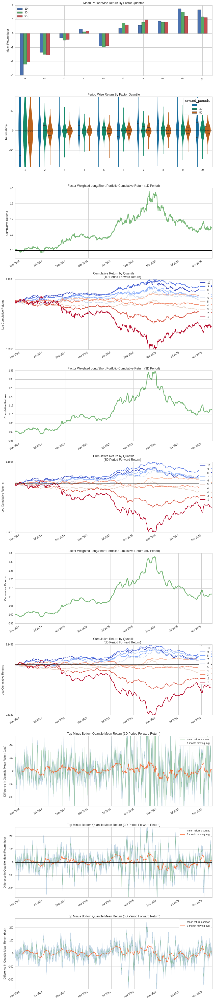

Information Analysis


,1D,3D,5D
IC Mean,0.015,0.022,0.025
IC Std.,0.134,0.134,0.132
Risk-Adjusted IC,0.115,0.163,0.191
t-stat(IC),3.105,4.398,5.157
p-value(IC),0.002,0.000,0.000
IC Skew,0.008,-0.059,-0.066
IC Kurtosis,0.059,-0.064,0.019


/venvs/py35/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


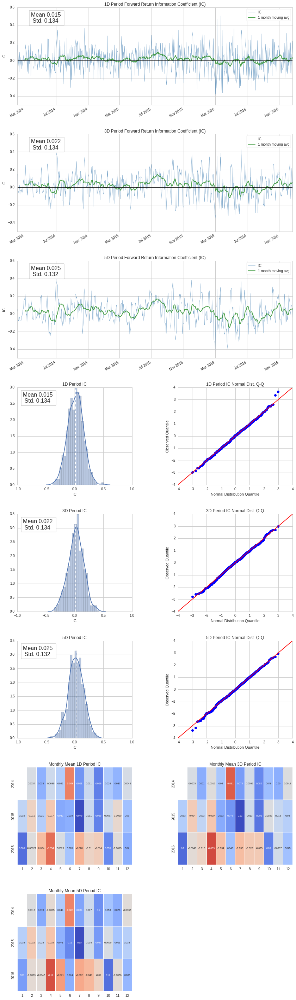

Turnover Analysis


,1D,3D,5D
Quantile 1 Mean Turnover,0.025,0.047,0.066
Quantile 2 Mean Turnover,0.067,0.123,0.164
Quantile 3 Mean Turnover,0.130,0.234,0.304
Quantile 4 Mean Turnover,0.190,0.329,0.415
Quantile 5 Mean Turnover,0.231,0.390,0.481
Quantile 6 Mean Turnover,0.260,0.427,0.520
Quantile 7 Mean Turnover,0.270,0.435,0.526
Quantile 8 Mean Turnover,0.250,0.409,0.498
Quantile 9 Mean Turnover,0.191,0.325,0.407
Quantile 10 Mean Turnover,0.078,0.141,0.185


,1D,3D,5D
Mean Factor Rank Autocorrelation,0.993,0.979,0.966


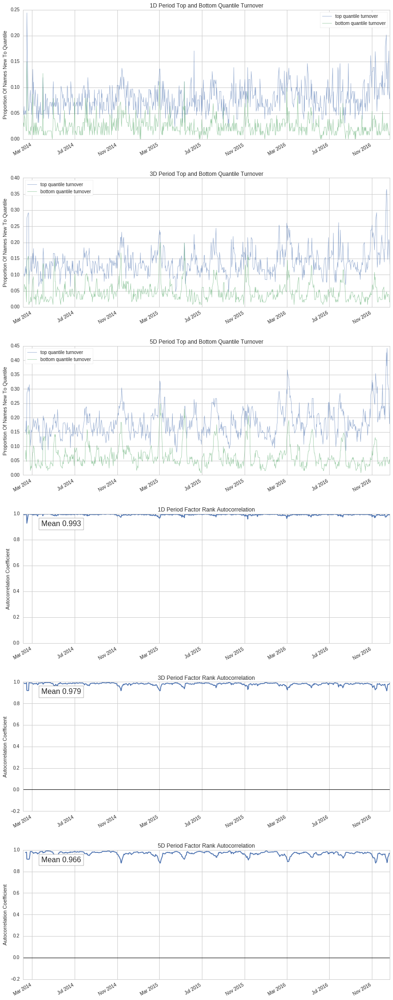

In [11]:
alphalens.tears.create_full_tear_sheet(factor_data, long_short=True)

## Backtests Tearsheets
####  Optimizing Alpha 

100% Time:  0:00:08|##########################################################|


Start date,2014-02-03
End date,2015-12-30
Total months,22
,Backtest
Annual return,39.792%
Cumulative returns,89.785%
Annual volatility,18.566%
Sharpe ratio,1.90
Calmar ratio,2.82
Stability,0.92
Max drawdown,-14.091%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.09,2015-01-28,2015-06-02,2015-07-10,118
1,11.56,2015-10-01,2015-10-08,2015-11-20,37
2,10.77,2015-08-20,2015-09-16,2015-10-01,31
3,7.52,2015-12-17,2015-12-24,NaT,NaN
4,5.55,2014-11-06,2014-11-24,2014-12-04,21


Stress Events,mean,min,max
Apr14,0.16%,-0.59%,0.97%
Oct14,0.32%,-2.59%,4.57%
Fall2015,0.08%,-6.46%,3.42%
New Normal,0.14%,-6.46%,4.57%


Top 10 long positions of all time,max
BPT-1068,6.41%
KING-46610,6.24%
OWW-34300,6.13%
CSIQ-32856,5.90%
WNR-27997,5.89%
EW-21382,5.88%
ANDV-7612,5.85%
GPRE-28159,5.82%
PBF-43713,5.76%
QCOR-20914,5.72%


Top 10 short positions of all time,max
VNR-34931,-9.02%
LINE-27993,-8.76%
SRPT-16999,-8.73%
SUNE-13306,-7.47%
MDR-4752,-7.21%
UNT-7806,-7.10%
JCP-4118,-7.05%
CZR-42461,-6.97%
SHLD-26169,-6.90%
FCX-13197,-6.85%


Top 10 positions of all time,max
VNR-34931,9.02%
LINE-27993,8.76%
SRPT-16999,8.73%
SUNE-13306,7.47%
MDR-4752,7.21%
UNT-7806,7.10%
JCP-4118,7.05%
CZR-42461,6.97%
SHLD-26169,6.90%
FCX-13197,6.85%


## Performance Relative to Common Risk Factors

Summary Statistics,
Annualized Specific Return,27.15%
Annualized Common Return,10.41%
Annualized Total Return,39.79%
Specific Sharpe Ratio,1.82


Exposures Summary,Average Risk Factor Exposure,Annualized Return,Cumulative Return
basic_materials,-0.03,-0.52%,-1.00%
consumer_cyclical,-0.02,-0.39%,-0.74%
financial_services,0.00,-0.02%,-0.03%
real_estate,-0.00,-0.02%,-0.04%
consumer_defensive,0.00,0.14%,0.28%
health_care,-0.04,-0.98%,-1.87%
utilities,0.00,0.00%,0.00%
communication_services,-0.00,-0.02%,-0.04%
energy,-0.12,1.38%,2.65%
industrials,-0.01,-0.26%,-0.49%


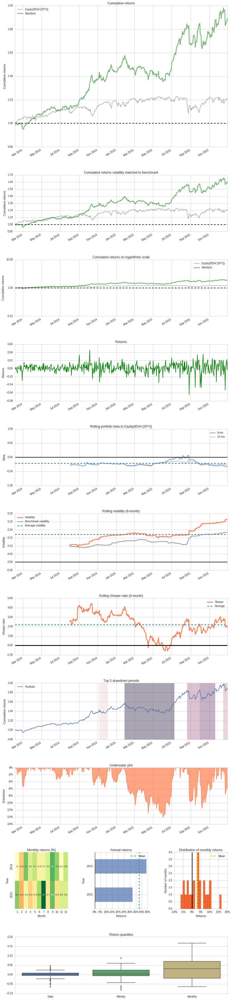

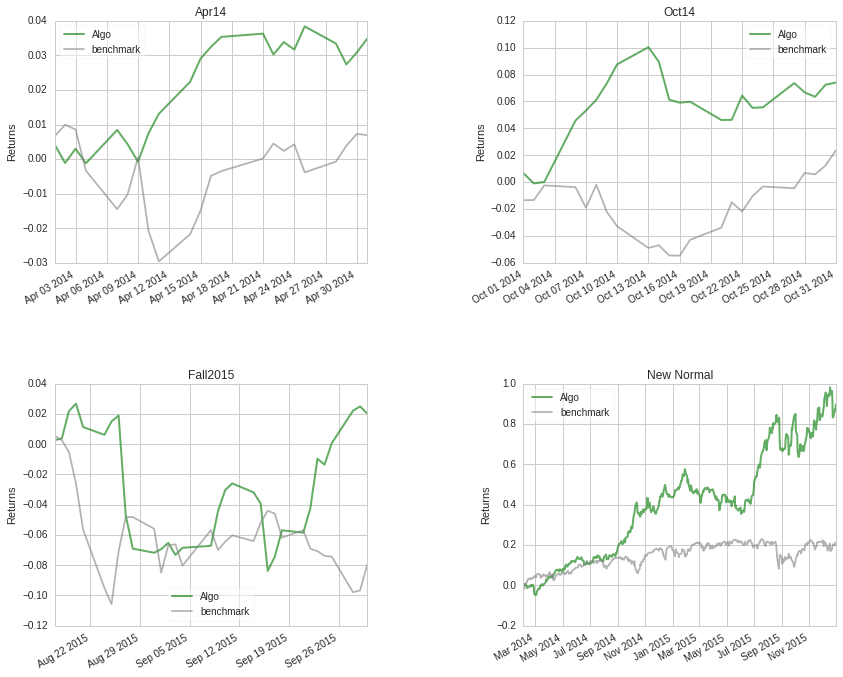

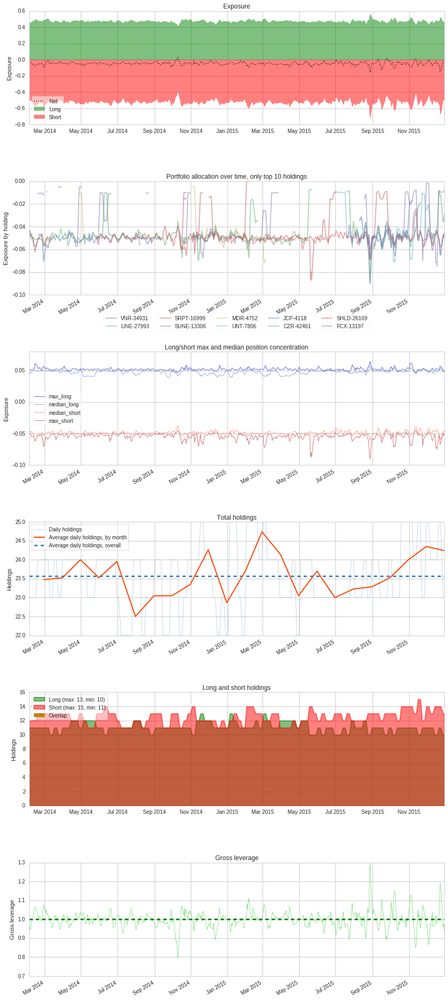

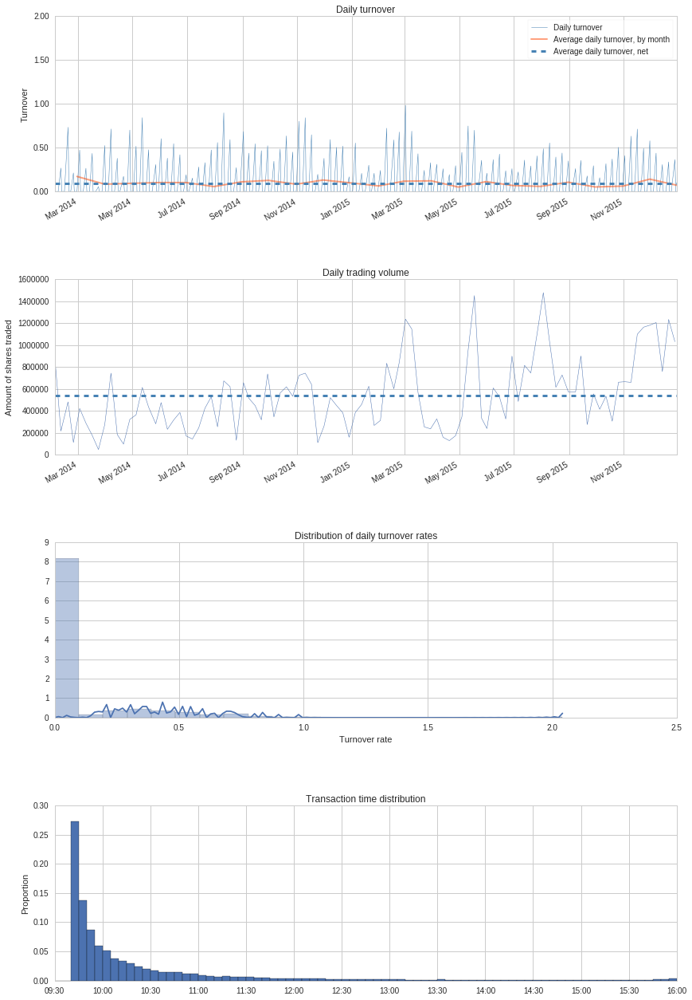

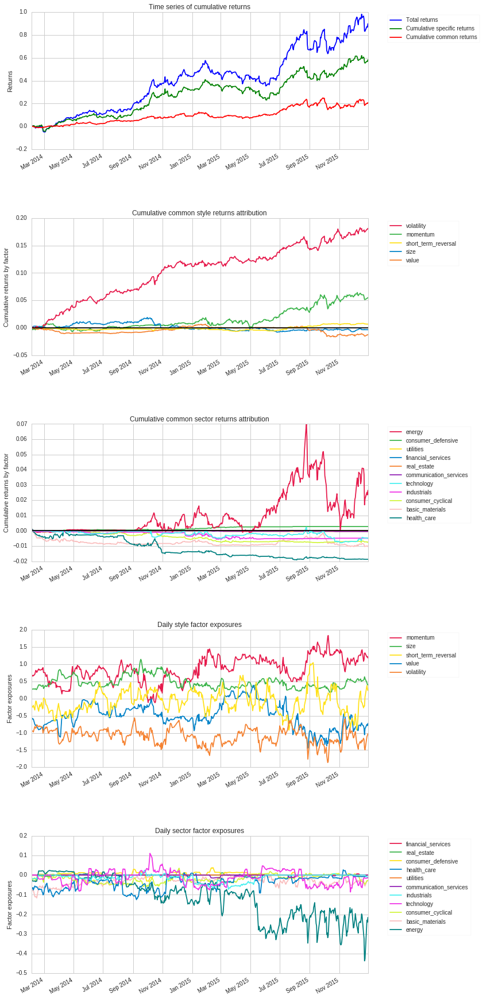

In [2]:
bt = get_backtest('5e095e426b370f5513156e89')
bt.create_full_tear_sheet()

#### 2008 Crisis Test

100% Time:  0:00:42|##########################################################|


Start date,2007-03-01
End date,2016-12-30
Total months,118
,Backtest
Annual return,5.075%
Cumulative returns,62.74%
Annual volatility,15.2%
Sharpe ratio,0.40
Calmar ratio,0.11
Stability,0.48
Max drawdown,-45.669%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,45.67,2008-01-04,2011-01-06,2013-04-01,1367
1,27.92,2016-01-12,2016-09-30,NaT,NaN
2,14.88,2013-04-01,2013-09-10,2013-12-06,180
3,11.70,2015-02-23,2015-06-09,2015-07-23,109
4,10.27,2007-08-01,2007-08-09,2007-08-24,18


Stress Events,mean,min,max
Lehman,-0.41%,-3.58%,2.62%
US downgrade/European Debt Crisis,0.09%,-2.40%,1.64%
Fukushima,0.04%,-1.04%,0.97%
EZB IR Event,-0.02%,-1.24%,1.35%
Aug07,0.00%,-4.04%,3.93%
Mar08,-0.25%,-1.44%,1.03%
Sept08,-0.47%,-3.58%,2.62%
2009Q1,0.21%,-3.47%,2.71%
2009Q2,-0.40%,-3.52%,2.30%
Flash Crash,0.44%,-0.14%,1.12%


Top 10 long positions of all time,max
DRYS-26994,7.49%
CTV-17188,6.77%
STRZ_A-32045,6.65%
IPHS-32820,6.52%
GLF-3265,6.48%
CF-27558,6.46%
VRGY-32225,6.45%
AOBC-24519,6.39%
GTAT-36628,6.38%
GTI-23687,6.36%


Top 10 short positions of all time,max
CHK-8461,-10.79%
HGSI-10409,-10.25%
UAL-28051,-10.20%
SIRI-11901,-9.07%
SRPT-16999,-8.82%
VNR-34931,-8.75%
RMBS-16945,-8.74%
ITMN-21284,-8.72%
ARIA-11880,-8.42%
DNDN_Q-21612,-8.11%


Top 10 positions of all time,max
CHK-8461,10.79%
HGSI-10409,10.25%
UAL-28051,10.20%
SIRI-11901,9.07%
SRPT-16999,8.82%
VNR-34931,8.75%
RMBS-16945,8.74%
ITMN-21284,8.72%
ARIA-11880,8.42%
DNDN_Q-21612,8.11%


## Performance Relative to Common Risk Factors

Summary Statistics,
Annualized Specific Return,1.19%
Annualized Common Return,3.99%
Annualized Total Return,5.07%
Specific Sharpe Ratio,0.16


Exposures Summary,Average Risk Factor Exposure,Annualized Return,Cumulative Return
basic_materials,0.00,-0.45%,-4.34%
consumer_cyclical,0.01,0.54%,5.42%
financial_services,0.00,-0.00%,-0.03%
real_estate,0.00,-0.00%,-0.04%
consumer_defensive,0.01,0.02%,0.24%
health_care,-0.03,-0.44%,-4.28%
utilities,0.00,-0.01%,-0.08%
communication_services,0.00,-0.10%,-0.95%
energy,-0.03,-0.27%,-2.65%
industrials,-0.00,-0.02%,-0.18%


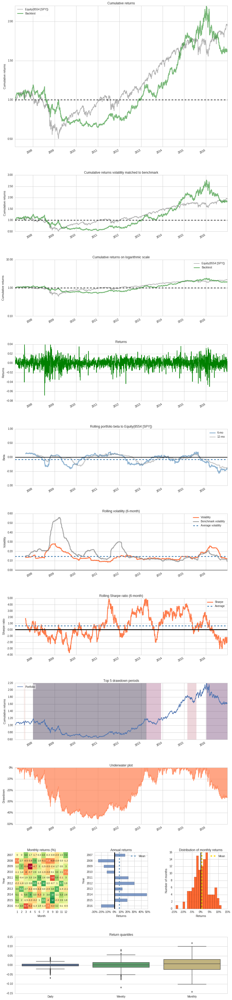

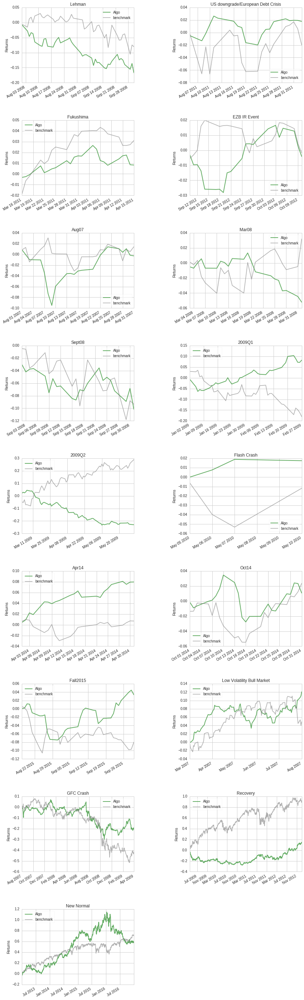

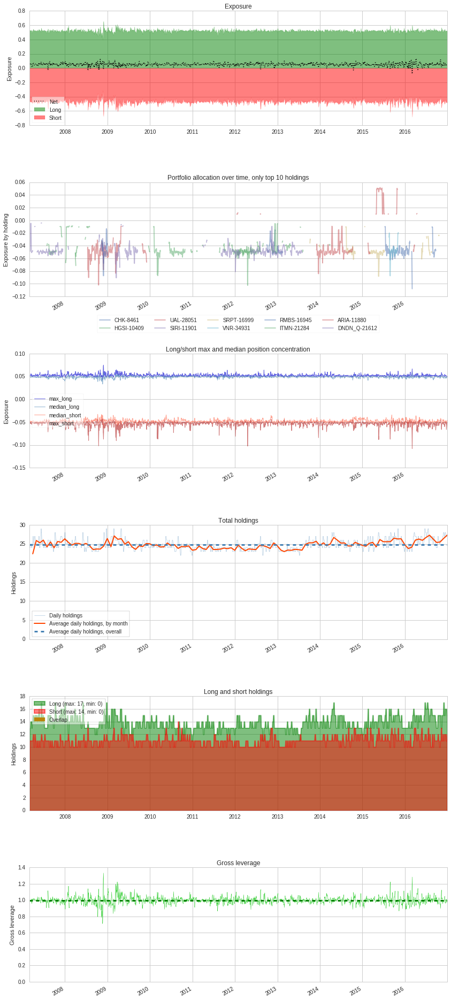

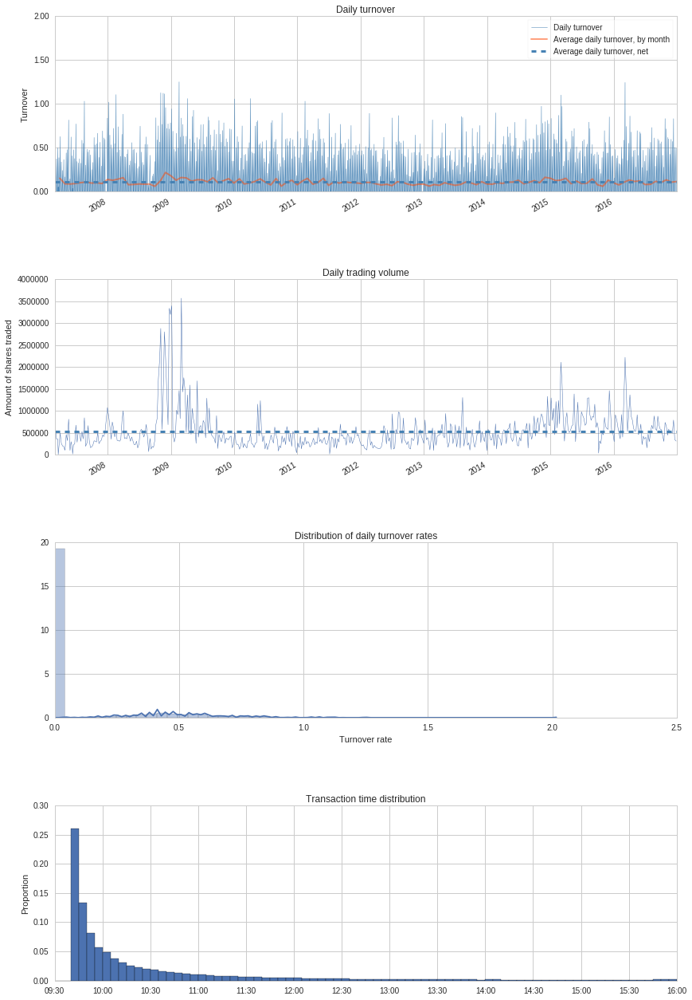

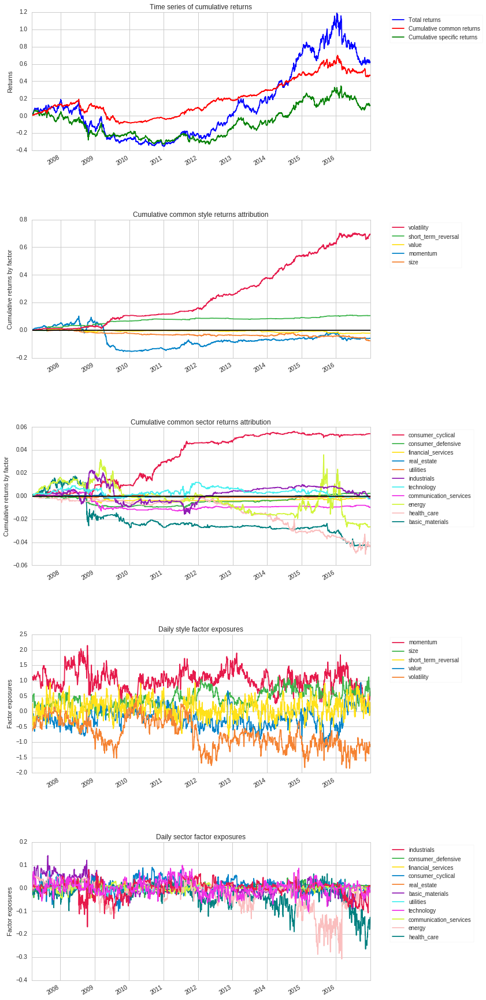

In [3]:
bt = get_backtest('5e0b7b0e9d42ea54a1823e8a')
bt.create_full_tear_sheet()

#### Optimizing Target Weights

100% Time:  0:00:59|##########################################################|


Start date,2007-03-01
End date,2017-11-30
Total months,129
,Backtest
Annual return,2.202%
Cumulative returns,26.4%
Annual volatility,6.03%
Sharpe ratio,0.39
Calmar ratio,0.08
Stability,0.54
Max drawdown,-26.061%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,26.06,2009-03-09,2010-02-12,2014-12-15,1506
1,11.93,2016-01-19,2017-09-07,NaT,NaN
2,9.45,2008-07-14,2008-09-19,2008-11-19,93
3,7.25,2008-11-21,2009-01-06,2009-02-23,67
4,4.45,2007-08-01,2007-08-09,2007-09-19,36


/venvs/py35/lib/python3.5/site-packages/numpy/lib/function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


Stress Events,mean,min,max
Lehman,-0.11%,-1.24%,1.32%
US downgrade/European Debt Crisis,0.09%,-0.79%,0.71%
Fukushima,0.03%,-0.23%,0.25%
EZB IR Event,0.04%,-0.41%,0.49%
Aug07,0.01%,-2.14%,2.06%
Mar08,-0.04%,-0.77%,0.47%
Sept08,-0.12%,-1.24%,1.32%
2009Q1,0.08%,-2.25%,1.23%
2009Q2,-0.25%,-2.15%,2.53%
Flash Crash,0.40%,0.11%,0.83%


Top 10 long positions of all time,max
RIG-9038,0.83%
NE-5249,0.80%
CBRE-26367,0.79%
RDC-6392,0.79%
BPT-1068,0.79%
HMA-3596,0.79%
VLO-7990,0.78%
MYGN-13698,0.77%
CNC-23283,0.77%
CVI-22766,0.77%


Top 10 short positions of all time,max
HRI-32887,-1.03%
GNW-26323,-1.00%
HERO-27747,-0.96%
XCO-28083,-0.96%
OMX-764,-0.92%
TLRD-7203,-0.90%
RAD-6330,-0.89%
JBLU-23599,-0.88%
ITMN-21284,-0.87%
UAL-28051,-0.87%


Top 10 positions of all time,max
HRI-32887,1.03%
GNW-26323,1.00%
HERO-27747,0.96%
XCO-28083,0.96%
OMX-764,0.92%
TLRD-7203,0.90%
RAD-6330,0.89%
JBLU-23599,0.88%
ITMN-21284,0.87%
UAL-28051,0.87%


/venvs/py35/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


## Performance Relative to Common Risk Factors

Summary Statistics,
Annualized Specific Return,1.15%
Annualized Common Return,1.09%
Annualized Total Return,2.20%
Specific Sharpe Ratio,0.34


Exposures Summary,Average Risk Factor Exposure,Annualized Return,Cumulative Return
basic_materials,0.00,-0.04%,-0.44%
consumer_cyclical,-0.01,-0.21%,-2.26%
financial_services,0.01,0.01%,0.12%
real_estate,-0.01,-0.21%,-2.20%
consumer_defensive,0.01,0.11%,1.15%
health_care,-0.03,-0.59%,-6.16%
utilities,-0.00,-0.09%,-0.92%
communication_services,-0.01,-0.08%,-0.86%
energy,-0.02,-0.22%,-2.35%
industrials,-0.00,-0.16%,-1.69%


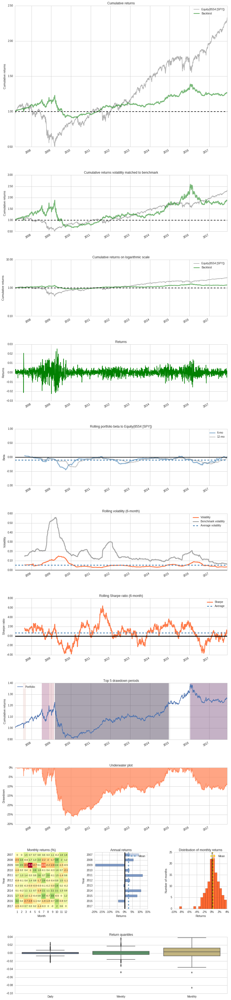

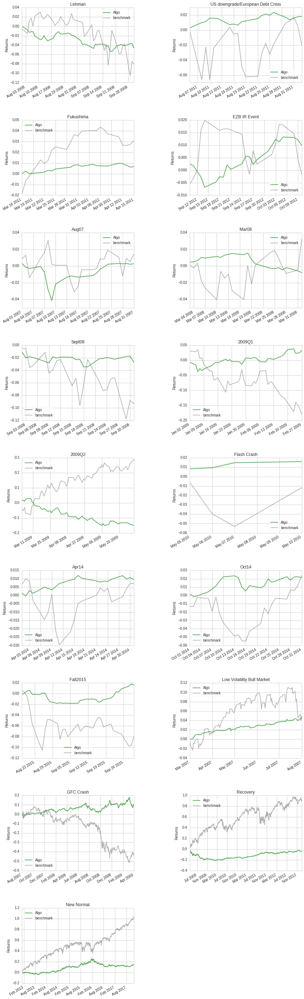

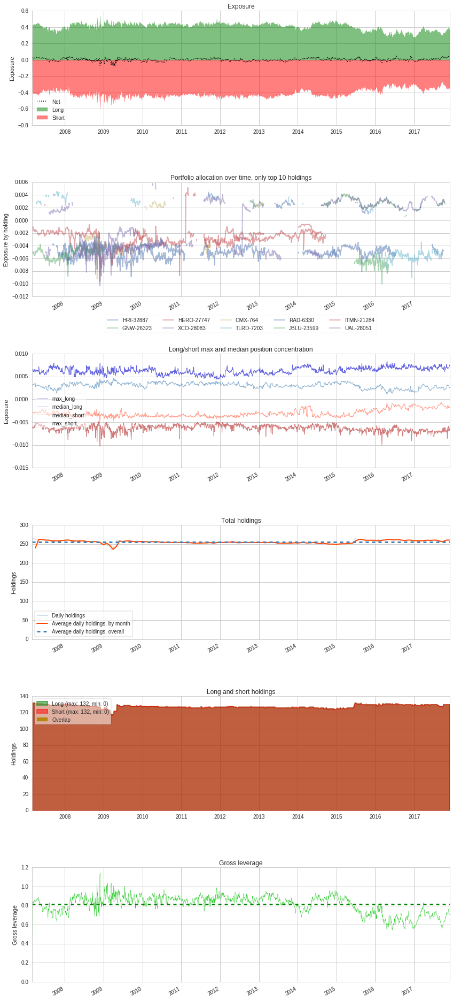

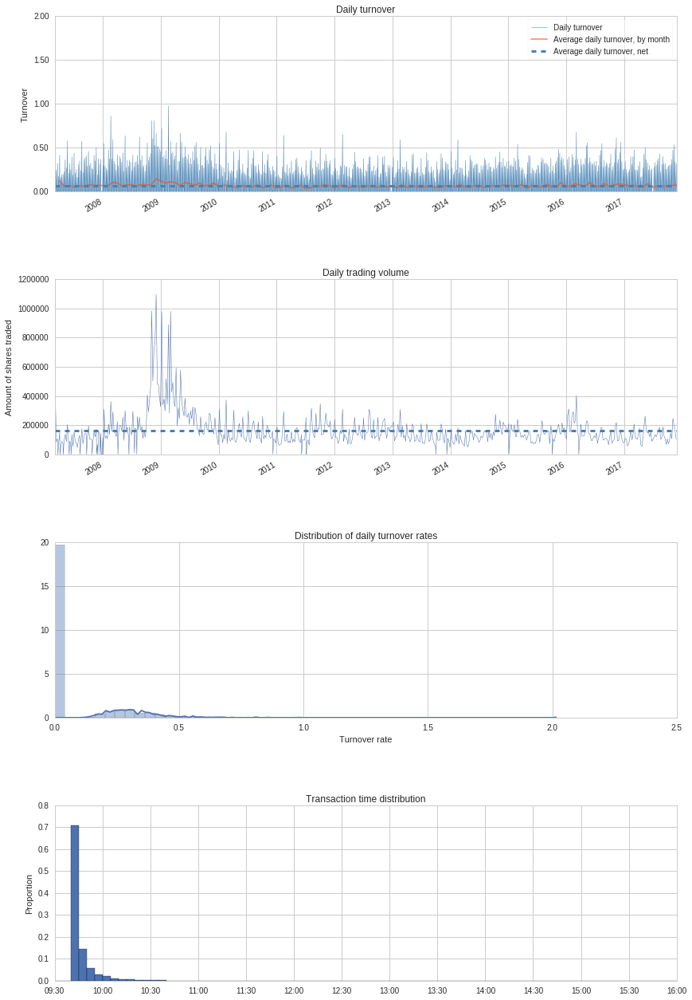

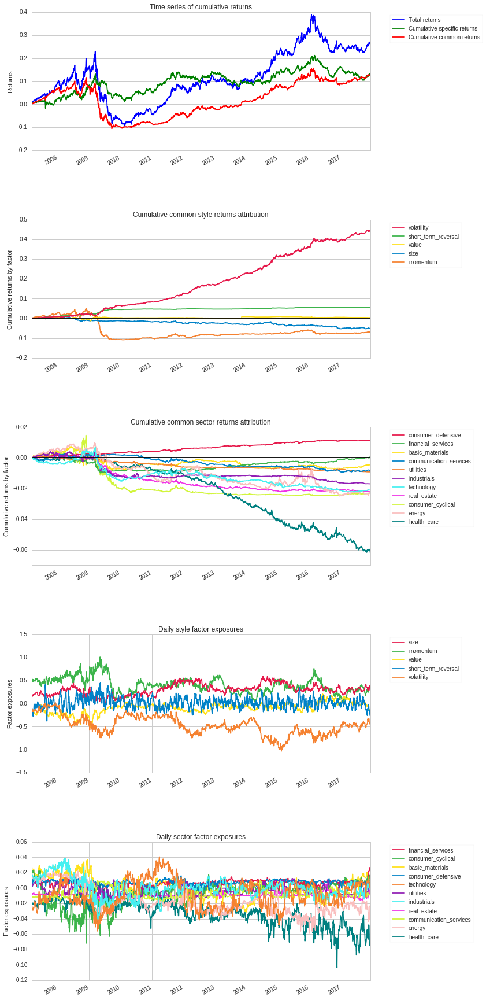

In [1]:
bt = get_backtest('5e0be33c2e7e00554e0cc81d')
bt.create_full_tear_sheet()

#### Reducing Maximum concentration for a single position to increase diversification, reduce risk

100% Time:  0:00:06|##########################################################|


Start date,2014-02-03
End date,2015-12-30
Total months,22
,Backtest
Annual return,13.422%
Cumulative returns,27.24%
Annual volatility,10.03%
Sharpe ratio,1.31
Calmar ratio,1.67
Stability,0.85
Max drawdown,-8.06%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,8.06,2014-04-28,2014-06-30,2014-09-24,108
1,5.73,2014-12-15,2015-06-08,2015-07-22,158
2,5.40,2015-10-01,2015-10-09,2015-11-12,31
3,3.62,2015-08-26,2015-08-31,2015-09-22,20
4,3.59,2014-11-06,2014-11-25,2014-12-08,23


/venvs/py35/lib/python3.5/site-packages/numpy/lib/function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


Stress Events,mean,min,max
Apr14,0.03%,-0.76%,0.66%
Oct14,0.19%,-1.89%,1.18%
Fall2015,0.17%,-1.87%,1.59%
New Normal,0.05%,-3.03%,2.07%


Top 10 long positions of all time,max
SCMP-34477,1.42%
CSTE-42704,1.28%
CSIQ-32856,1.26%
AMAG-659,1.24%
KING-46610,1.23%
UTHR-20306,1.23%
MYGN-13698,1.22%
CBM-1297,1.22%
TARO-7308,1.21%
SDLP-43539,1.21%


Top 10 short positions of all time,max
ITMN-21284,-2.83%
SRPT-16999,-1.72%
VNR-34931,-1.69%
ARIA-11880,-1.67%
LINE-27993,-1.65%
MACK-42735,-1.60%
TROX-40530,-1.59%
BNFT-45428,-1.58%
ARRY-22192,-1.57%
SUNE-13306,-1.51%


Top 10 positions of all time,max
ITMN-21284,2.83%
SRPT-16999,1.72%
VNR-34931,1.69%
ARIA-11880,1.67%
LINE-27993,1.65%
MACK-42735,1.60%
TROX-40530,1.59%
BNFT-45428,1.58%
ARRY-22192,1.57%
SUNE-13306,1.51%


/venvs/py35/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


## Performance Relative to Common Risk Factors

Summary Statistics,
Annualized Specific Return,4.94%
Annualized Common Return,8.21%
Annualized Total Return,13.42%
Specific Sharpe Ratio,0.74


Exposures Summary,Average Risk Factor Exposure,Annualized Return,Cumulative Return
basic_materials,-0.02,-0.15%,-0.28%
consumer_cyclical,-0.01,-0.30%,-0.58%
financial_services,0.00,-0.02%,-0.03%
real_estate,-0.00,0.03%,0.06%
consumer_defensive,0.01,0.09%,0.18%
health_care,-0.07,-1.40%,-2.65%
utilities,0.00,-0.02%,-0.05%
communication_services,-0.01,-0.01%,-0.02%
energy,-0.05,0.43%,0.83%
industrials,-0.01,-0.09%,-0.17%


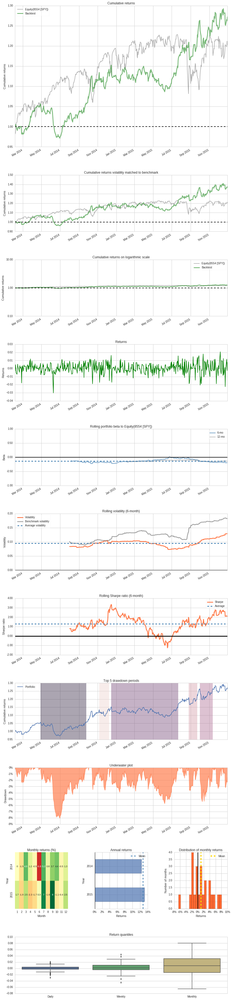

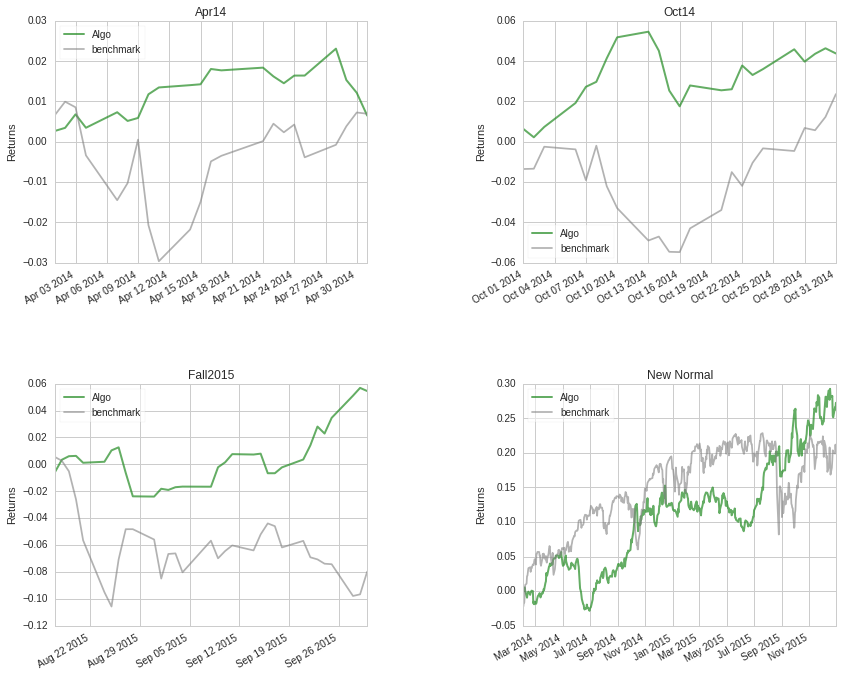

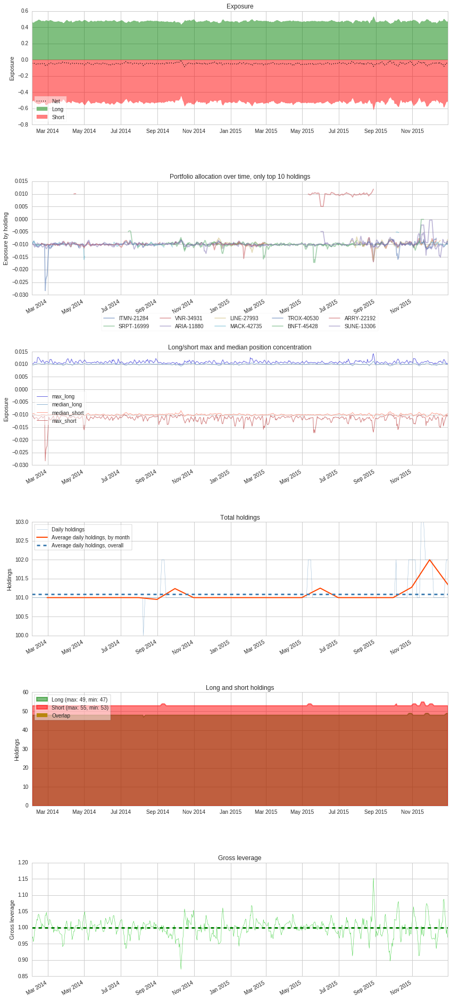

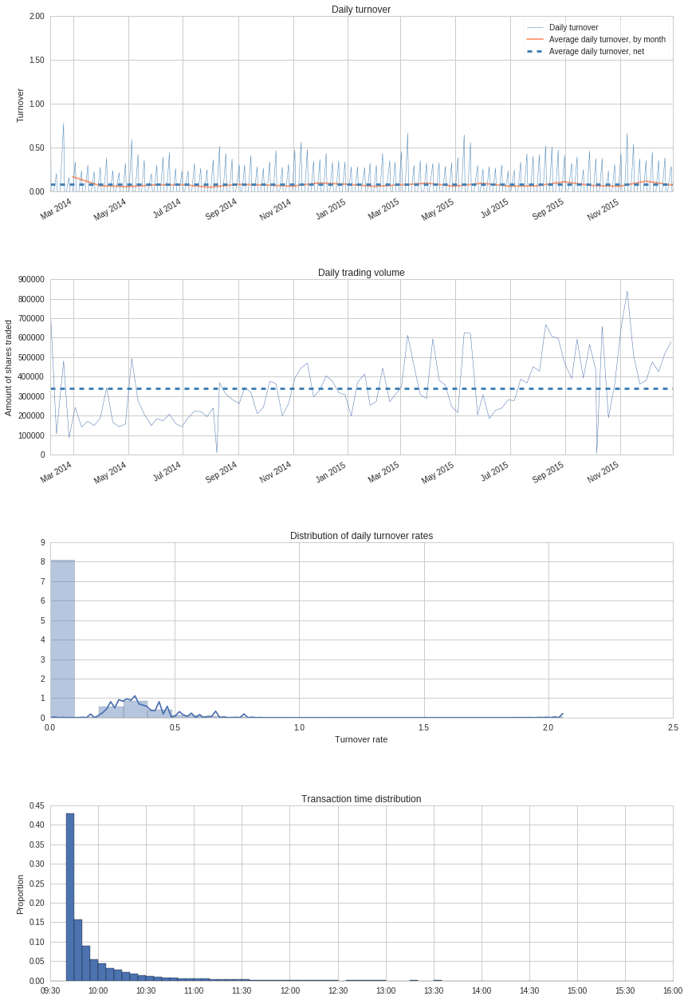

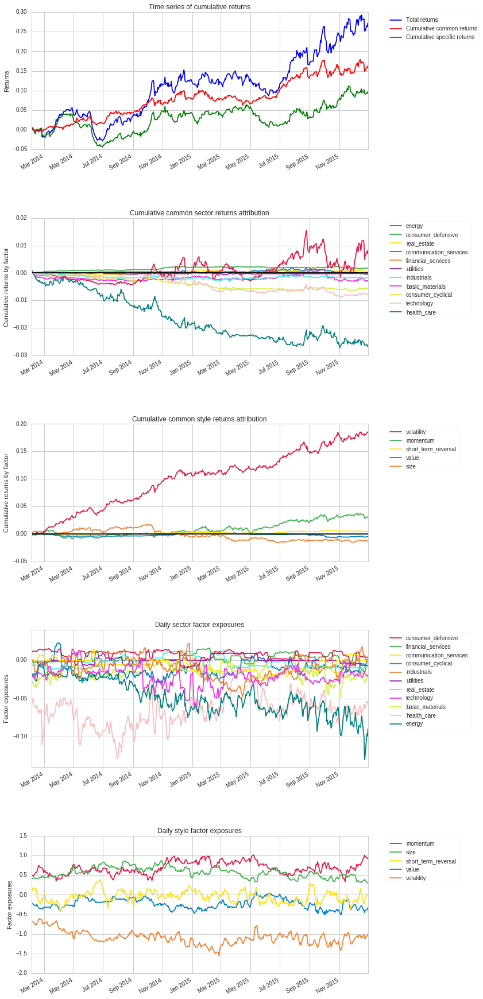

In [1]:
bt = get_backtest('5e0dbc51bd7f7a563a2c6c74')
bt.create_full_tear_sheet()